# 1. Simple Image Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Loading Images](#loading)
3. [Resizing Images](#resize)
4. [Negative Images](#negative)
5. [Logarithmic Transformation](#log)
6. [Image Binarizer](#bin)
7. [Image Quantizer](#quant)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

## Loading Images <a class="anchor" id="loading"></a>

<class 'numpy.ndarray'>


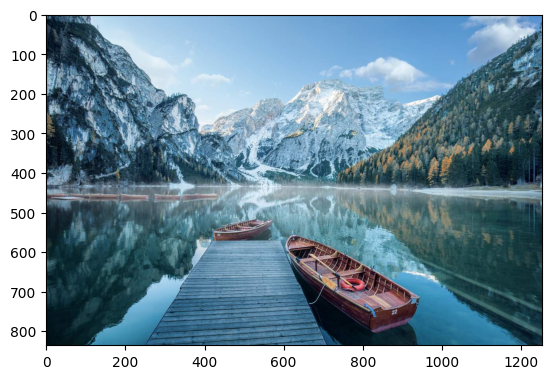

In [3]:
img1 = mpimg.imread('/content/drive/MyDrive/VisionComp_Imagenes/data/lago_1.jpg')
plt.imshow(img1)
print(type(img1))


Look at the shape of this array:

In [4]:
img1.shape

(836, 1254, 3)

The image is actually composed of three "layers, or *channels*, for red, green, and blue (RGB) pixel intensities.

Display the same image but this time we'll use another popular Python library for working with images - **cv2**.

numpy.ndarray

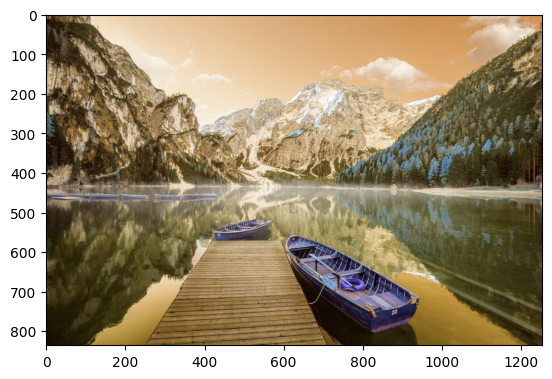

In [5]:
img2 = cv2.imread('/content/drive/MyDrive/VisionComp_Imagenes/data/lago_1.jpg')
plt.imshow(img2)
type(img2)

The trouble is that cv2 loads the array of image data with the channels ordered as blue, green, red (BGR) instead of red, green blue (RGB).

Let's fix that

AxesImage(shape=(836, 1254, 3))


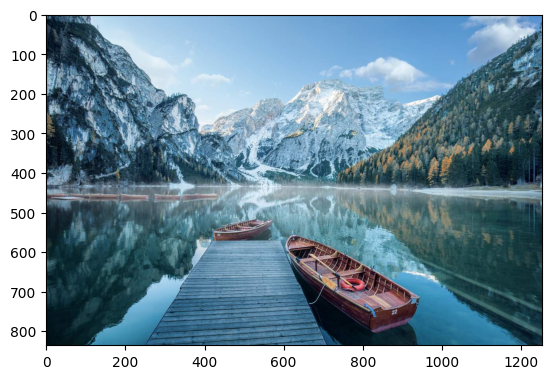

In [6]:
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
print(plt.imshow(img2))

Lastly, one more commonly used library for image processing in Python we should consider - **PIL**:

<class 'PIL.JpegImagePlugin.JpegImageFile'>


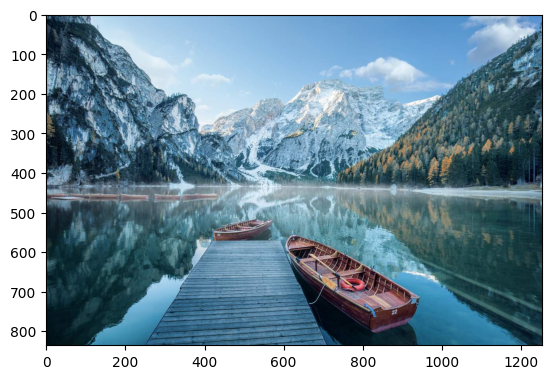

In [7]:
from PIL import Image
import matplotlib.pyplot as plt

img3 = Image.open('/content/drive/MyDrive/VisionComp_Imagenes/data/lago_1.jpg')
plt.imshow(img3)
print(type(img3))

It's easy to convert a PIL JpegImageFile to a numpy array

In [8]:
img3 = np.array(img3)
img3.shape

(836, 1254, 3)

Saving a numpy array in an optimized format, should you need to persist images into storage

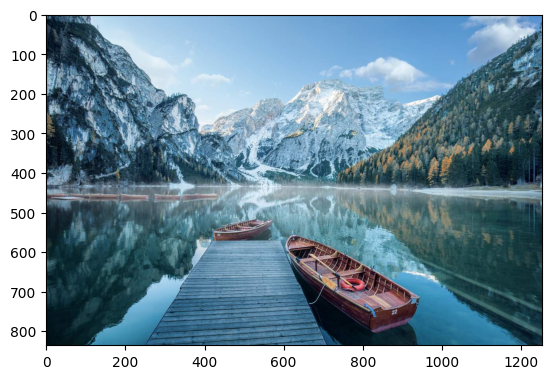

In [9]:
# Save the image
np.save('/content/drive/MyDrive/VisionComp_Imagenes/data/img.npy', img3)

# Load the image
img3 = np.load('/content/drive/MyDrive/VisionComp_Imagenes/data/img.npy')

plt.imshow(img3)

## Resizing an Image <a class="anchor" id="resize"></a>
One of the most common manipulations of an image is to resize it.

Generally, we want to ensure that all of your training images have consistent dimensions.

Original size: 1254 x 836
New size: 200 x 200


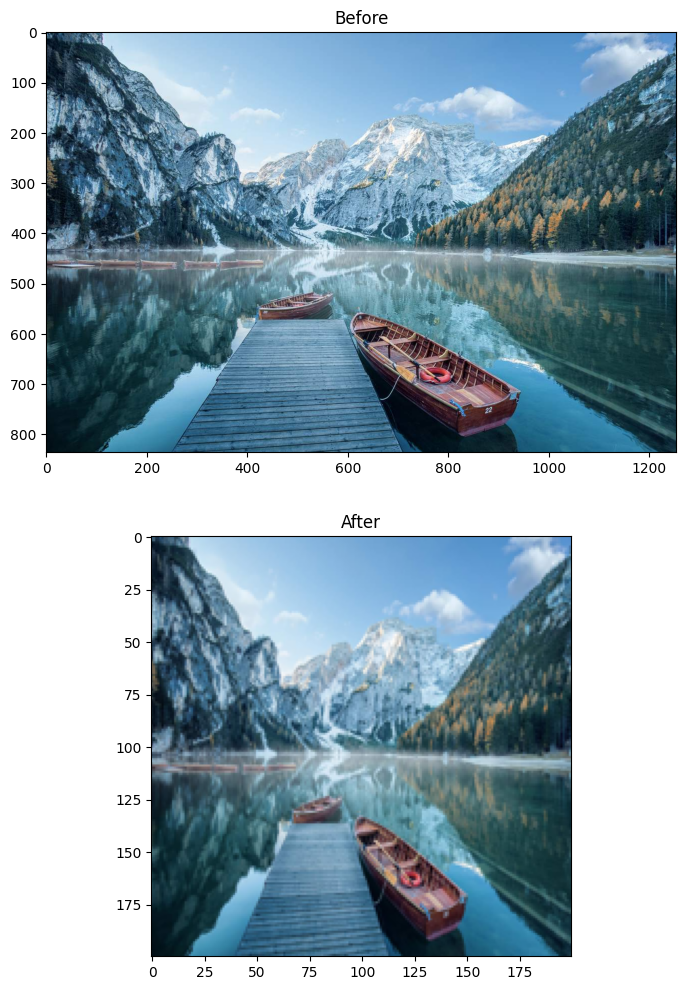

In [10]:
from PIL import Image, ImageOps

# Load the image array into a PIL Image
orig_img = Image.fromarray(img3)

# Get the image size
o_h, o_w = orig_img.size
print('Original size:', o_h, 'x', o_w)

# We'll resize this so it's 200 x 200
target_size = (200,200)
new_img = orig_img.resize(target_size)
n_h, n_w = new_img.size
print('New size:', n_h, 'x', n_w)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Before')

# Subplot for resized image
a=fig.add_subplot(2,1,2)
imgplot = plt.imshow(new_img)
a.set_title('After')

plt.show()


If we want to resize the image and change its shape without distorting it, we'll need to *scale* the image so that its largest dimension fits our new desired size.

Original size: 1254 x 836
Scaled size: 200 x 133
New size: 200 x 200


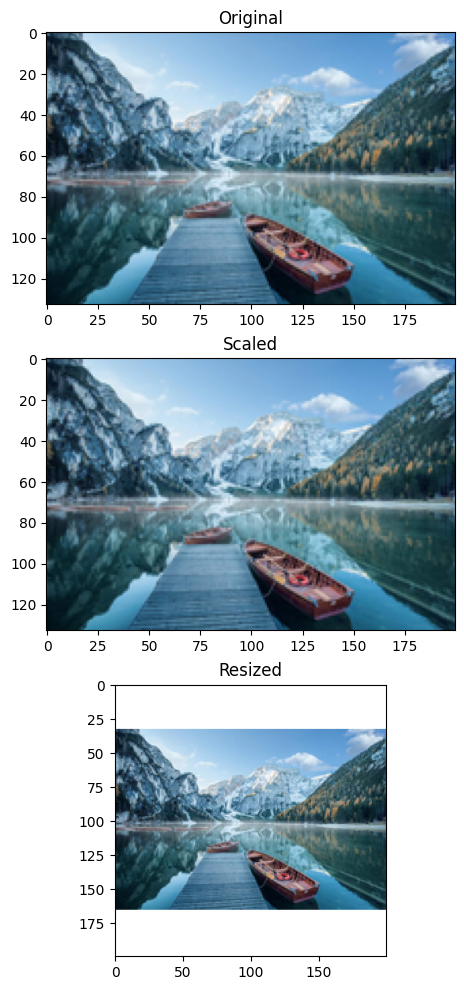

In [11]:
# Get the image size
orig_height, orig_width = orig_img.size
print('Original size:', orig_height, 'x', orig_width)

# We'll resize this so it's 200 x 200
target_size = (200,200)

# Scale the image to the new size using the thumbnail method
scaled_img = orig_img
scaled_img.thumbnail(target_size, Image.LANCZOS) #ANTIALIAS no longer available.
scaled_height, scaled_width = scaled_img.size
print('Scaled size:', scaled_height, 'x', scaled_width)

# Create a new white image of the target size to be the background
new_img = Image.new("RGB", target_size, (255, 255, 255))

# paste the scaled image into the center of the white background image
new_img.paste(scaled_img, (int((target_size[0] - scaled_img.size[0]) / 2), int((target_size[1] - scaled_img.size[1]) / 2)))
new_height, new_width = new_img.size
print('New size:', new_height, 'x', new_width)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(3,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

# Subplot for scaled image
a=fig.add_subplot(3,1,2)
imgplot = plt.imshow(scaled_img)
a.set_title('Scaled')

# Subplot for resized image
a=fig.add_subplot(3,1,3)
imgplot = plt.imshow(new_img)
a.set_title('Resized')

plt.show()

## Negative Images <a class="anchor" id="negative"></a>

In [12]:
orig_img = cv2.imread('/content/drive/MyDrive/VisionComp_Imagenes/data/lago_1.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
img_neg = 255 - orig_img

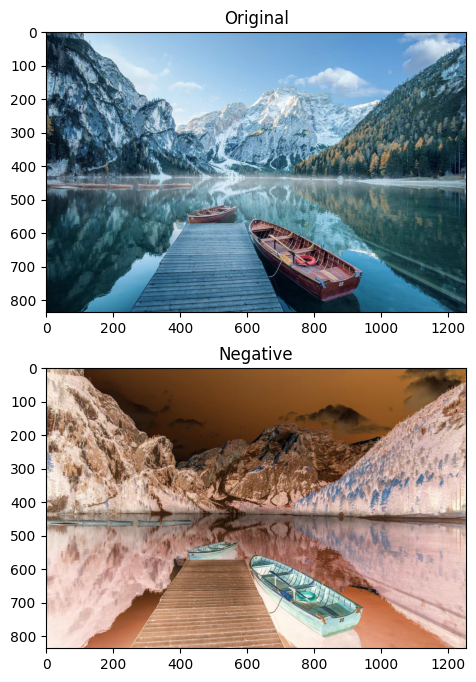

In [13]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Logarithmic Transformation <a class="anchor" id="log"></a>

$$
S = c * log (1 + r)
$$

where,
- $R$ = input pixel value
- $C$ = scaling constant and
- $S$ = output pixel value

The value of $c$ is chosen such that we get the maximum output value corresponding to the bit size used. So, the formula for calculating $c$  is as follows:

$c = 255 / (log (1 + $ max input pixel value $))$

In [14]:
orig_img = cv2.imread('/content/drive/MyDrive/VisionComp_Imagenes/data/lago_1.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# Apply log transformation method
c = 255 / np.log(1 + np.max(orig_img))
log_img = c * (np.log(orig_img + 1))

# Specify the data type so that
# float value will be converted to int
log_img = np.array(log_img, dtype = np.uint8)
log_img

<ipython-input-14-b1884aef712e>:6: RuntimeWarning: divide by zero encountered in log
  log_img = c * (np.log(orig_img + 1))
<ipython-input-14-b1884aef712e>:10: RuntimeWarning: invalid value encountered in cast
  log_img = np.array(log_img, dtype = np.uint8)


array([[[153, 187, 205],
        [158, 189, 207],
        [178, 201, 214],
        ...,
        [205, 228, 245],
        [205, 228, 245],
        [205, 228, 245]],

       [[151, 186, 205],
        [153, 187, 205],
        [162, 192, 209],
        ...,
        [205, 228, 245],
        [205, 228, 245],
        [205, 228, 245]],

       [[167, 196, 212],
        [167, 196, 211],
        [170, 198, 213],
        ...,
        [205, 228, 245],
        [205, 228, 245],
        [205, 228, 245]],

       ...,

       [[ 31, 124, 144],
        [ 31, 124, 144],
        [ 31, 124, 144],
        ...,
        [156, 188, 196],
        [158, 189, 196],
        [159, 189, 197]],

       [[ 31, 124, 144],
        [ 31, 124, 144],
        [ 31, 124, 144],
        ...,
        [153, 186, 194],
        [153, 186, 194],
        [154, 187, 195]],

       [[ 31, 124, 144],
        [ 31, 124, 144],
        [ 31, 124, 144],
        ...,
        [148, 184, 192],
        [149, 185, 193],
        [151, 186, 194]]

Log transformation of gives actual information by enhancing the image. If we apply this method in an image having higher pixel values then it will enhance the image more and actual information of the image will be lost.

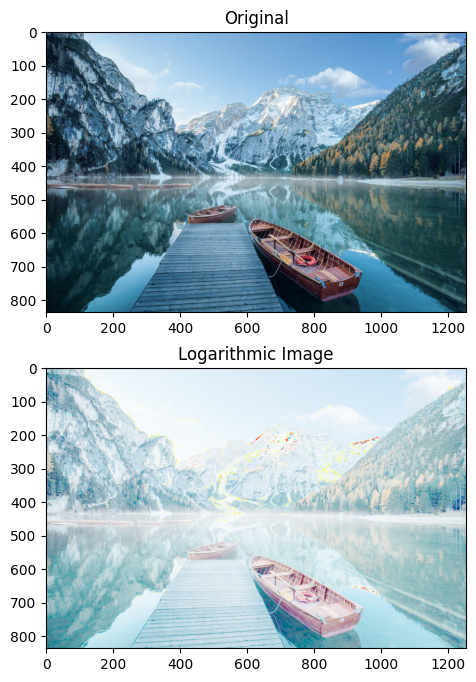

In [15]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(log_img)
a.set_title('Logarithmic Image')

plt.show()

## Image Binarizer (Thresholding) <a class="anchor" id="bin"></a>

Binarize pixels (set pixel values to 0 or 1) according to a threshold.

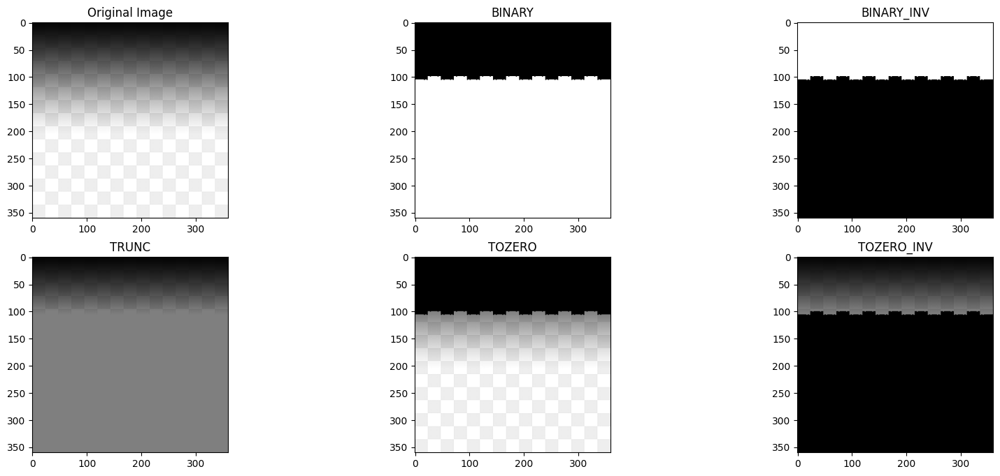

In [16]:
orig_img = cv2.imread('/content/drive/MyDrive/VisionComp_Imagenes/data/linear_gradient.png')
#orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

if orig_img is not None:
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
else:
  print("error")

ret,thresh1 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [orig_img, thresh1, thresh2, thresh3, thresh4, thresh5]
n = np.arange(6)

fig = plt.figure(figsize=(20, 8))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])

plt.show()

## Image Quantizer  <a class="anchor" id="quant"></a>

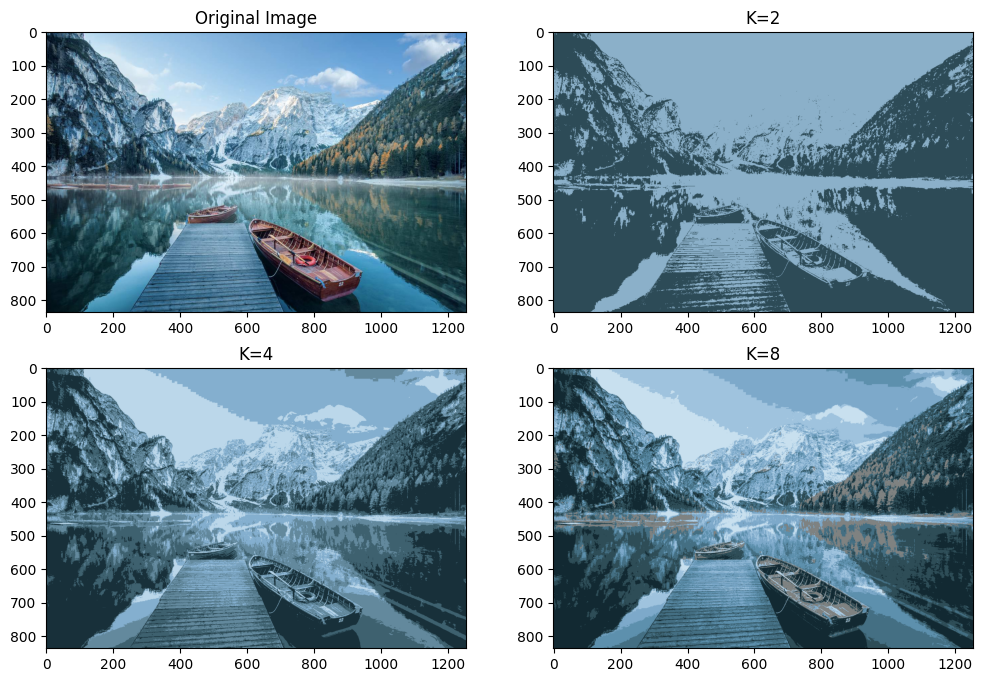

In [17]:
orig_img = cv2.imread('/content/drive/MyDrive/VisionComp_Imagenes/data/lago_1.jpg')

Z = orig_img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
def colorQuant(Z, K, criteria):

   ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

   # Now convert back into uint8, and make original image
   center = np.uint8(center)
   res = center[label.flatten()]
   res2 = res.reshape((orig_img.shape))
   return res2
res1 = colorQuant(Z, 2, criteria)
res2 = colorQuant(Z, 5, criteria)
res3 = colorQuant(Z, 8, criteria)

fig = plt.figure(figsize=(12, 8))

plt.subplot(221),plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(222),plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB))
plt.title('K=2')

plt.subplot(223),plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title('K=4')

plt.subplot(224),plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB))
plt.title('K=8')

plt.show()

In [18]:
# Punto 1

# Punto 1
Las transformaciones pixel a pixel son sumamente utilizadas para aumentar la cantidad de imágenes para entrenar modelos de inteligencia artificial, sobre todo aquellas de tipo fotométrico. Investiga 3 tipos de transformaciones y aplicarlas en el proyecto de Google Collab sobre imágenes propias.

<class 'numpy.ndarray'>
(361, 450, 3)


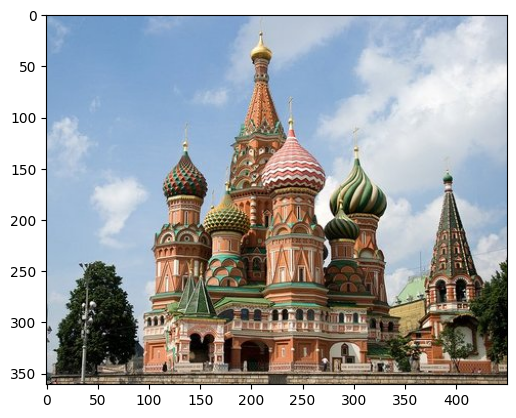

In [19]:
# Cargamos la ruta de la imagen
img_ej1="/content/drive/MyDrive/VisionComp_Imagenes/data/san_basilio.jpg"

#Leemos el archivo con CV2
imgCV2 = cv2.imread(img_ej1)

# Lemos la imagen en su formato original.
img_orig1 = mpimg.imread(img_ej1)
plt.imshow(img_orig1)
print(type(img_orig1))
print(imgCV2.shape)


1.1 Método de Separación de colores (RGB) \\

[Agregar choro]

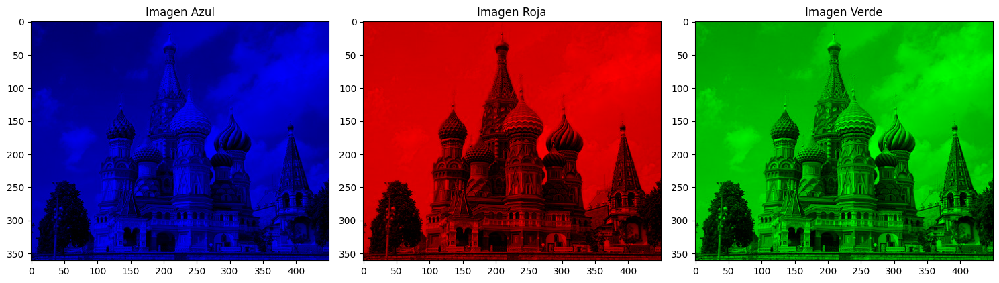

In [20]:
# Extraemos lo alto y ancho de la imagen
img_alto = imgCV2.shape[0]
img_ancho = imgCV2.shape[1]

# Se paramos por tipo de color
img_red = imgCV2.copy()
img_green = imgCV2.copy()
img_blue = imgCV2.copy()

for i in range(0,img_alto):
  for j in range(0,img_ancho):
    img_blue[i][j][0] = 0
    img_blue[i][j][1] = 0

    img_red[i][j][1] = 0
    img_red[i][j][2] = 0

    img_green[i][j][0] = 0
    img_green[i][j][2] = 0

# Almacenamos los valores guardados
array_blue = np.array(img_blue)
array_red = np.array(img_red)
array_green = np.array(img_green)

# guardamos las imagenes en formato .npy
np.save('array_blue.npy', array_blue)
np.save('array_red.npy', array_red)
np.save('array_green.npy', array_green)

# Cargamos los archivos guardados
array_blue = np.load('array_blue.npy')
array_red = np.load('array_red.npy')
array_green = np.load('array_green.npy')


# Creamos un grid de 1x3 como layout
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Adjust figsize as needed

axes[0].imshow(array_blue)
axes[0].set_title("Imagen Azul")

axes[1].imshow(array_red)
axes[1].set_title("Imagen Roja")

axes[2].imshow(array_green)
axes[2].set_title("Imagen Verde")

# Agreamos espacios
plt.tight_layout()

plt.show()


1.2 Escala de grises

$$ Escala Gris = 0.2989*R + 0.5870*G + 0.1140*B $$

In [21]:
def display_grayscale_conversion(img_path):
    """
    Funcion que lee una imagen y la transforma a escala de grises

    Parametros:
    img_path (str): Ruta de la imagen
    """
    # Lectura de la imagen
    imgCV2 = cv2.imread(img_path)

    # Convertimos en BGR la imagen importada de acuerdo a la formula de transformacion
    grayscale_image = (
        0.2989 * imgCV2[:, :, 2] +  # Canal rojo
        0.5870 * imgCV2[:, :, 1] +  # Canal verde
        0.1140 * imgCV2[:, :, 0]    # Canal azul
    )

    plt.figure(figsize=(10, 5))

    # Despliegue de la imagen original
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(imgCV2, cv2.COLOR_BGR2RGB))
    plt.title("Imagen Original")

    # Despliegue de la escala de gris
    plt.subplot(1, 2, 2)
    plt.imshow(grayscale_image, cmap="gray")
    plt.title("Imagen escala gris")

    plt.tight_layout()
    plt.show()

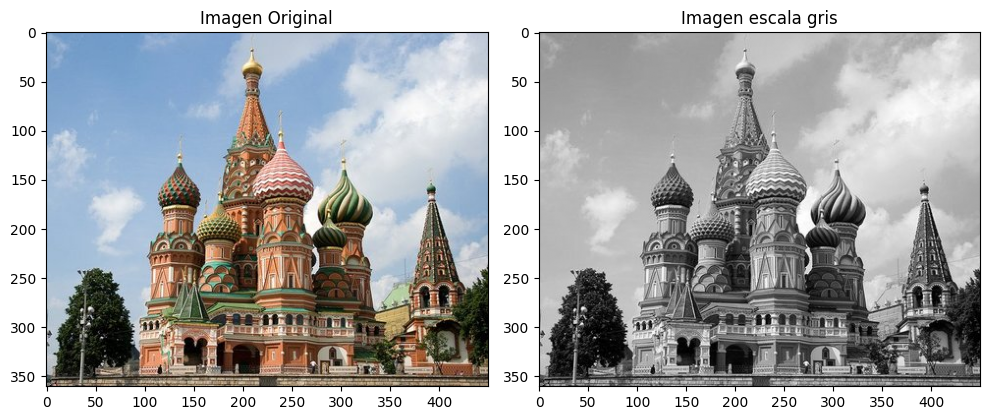

In [22]:
# Despliegue del codigo de escala de gris
img_path = img_ej1
display_grayscale_conversion(img_path)

1.3 Negativo de una Imagen

Calculamos el negativo de una imagen usado la formula:

$$ s = L -1 -r $$

In [23]:
def img_negative_and_display(img_path):
    """
    Lee una imagen y calcula su negativo usando la formula vista en clase.

    Parametros:
    img_path (str): Ruta de la imagen.
    """
    # Cargamos la imagen
    orig_img = cv2.imread(img_path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)  # Convert de BGR a RGB

    # Se crea una copia para el archivo salida
    img_out = orig_img.copy()

    # Calculo de dimensiones de la imagen
    alto = orig_img.shape[0]
    anch = orig_img.shape[1]

    # Calculamos el negativo pixel a pixel
    for i in range(0, alto):
        for j in range(0, anch):
            img_out[i][j] = 255 - orig_img[i][j]

    # Despliegue de las imagenes
    plt.figure(figsize=(10, 5))

    # Imagen original
    plt.subplot(1, 2, 1)
    plt.imshow(orig_img)
    plt.title("Imagen Original")

    # Imagen Negativa
    plt.subplot(1, 2, 2)
    plt.imshow(img_out)
    plt.title("Imagen Negativa")

    plt.tight_layout()
    plt.show()

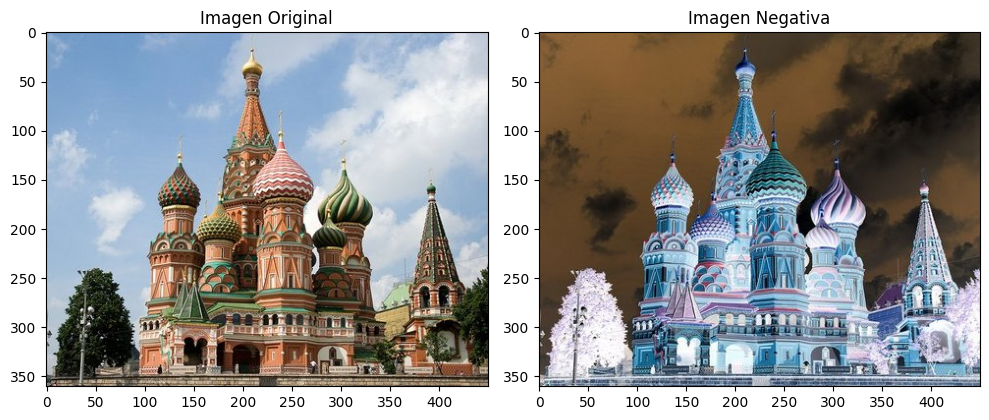

In [24]:
# Aplicacion de la funcion Negativo
img_path = img_ej1
img_negative_and_display(img_path)

# Punto 2
Investiga una aplicación donde obtener el negativo de imagen tenga un valor específico e integra el código en en una fila de google collab, justificar brevemente tu investigación y haciendo una demo sencilla.

Nota: Reutilizamos el código que ya tenemos previamente del cálculo del negativo.

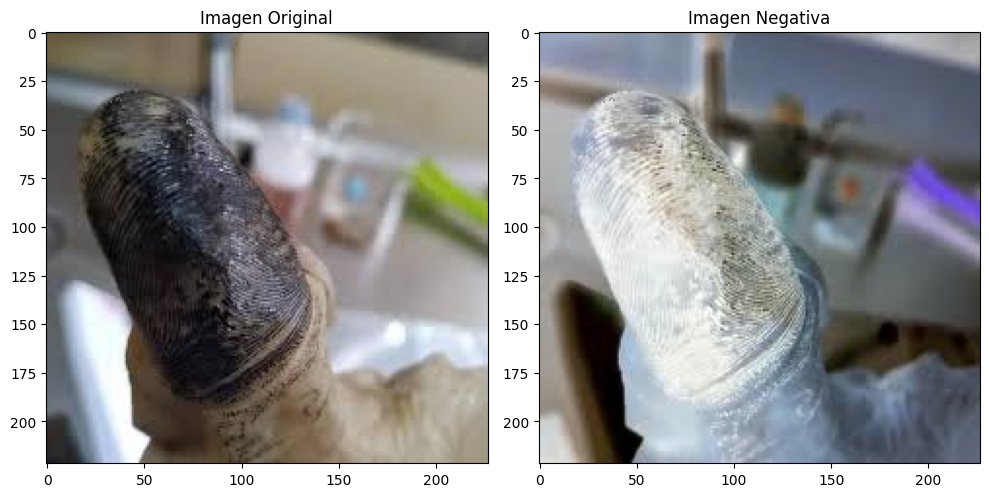

In [25]:
import cv2
import matplotlib.pyplot as plt

img_ej2="/content/drive/MyDrive/VisionComp_Imagenes/data/finger.jpg"

img_negative_and_display(img_ej2)

Procedimiento con fines de identificación humana.
Esta técnica se utiliza cuando el cadáver se encuentra en putrefacción (ya que hay desprendimiento de la piel).
NECRODACTILIA O NECROPAPAPILOSCOPIA, el cual es un procedimiento realizado a cadáveres para la toma de las huellas dactilares, en el caso que plantea en la imagen, cuando el cadáver esta en completa putrefacción se procede utilizar guantes epidérmicos y con la piel recuperada, se toma las necrodactilias mediante método dígito presión, donde el perito utiliza sus dedos como molde del guante epidérmico recuperado.

# Punto 3

Investiga una aplicación donde se puede aplicar la corrección de gamma en una imagen. Integra el código en en una fila de google collab, justifica brevemente tu investigación y haz una demo sencilla.

In [26]:
# definimos la funcion gamma

def corr_gamma(img, gamma):
    invGamma = 1 / gamma
    table = np.empty((1,256), np.uint8)
    for i in range(256):
        table[0,i] = np.clip(pow(i / 255.0, invGamma) * 255.0, 0, 25)
    output = cv2.LUT(img, table)
    return output

In [27]:
def hist_gamma(img,name):
  g_hist = cv2.calcHist([img],[0],None,[256],[0,256])
  plt.plot(g_hist)
  plt.title(name)
  plt.show()


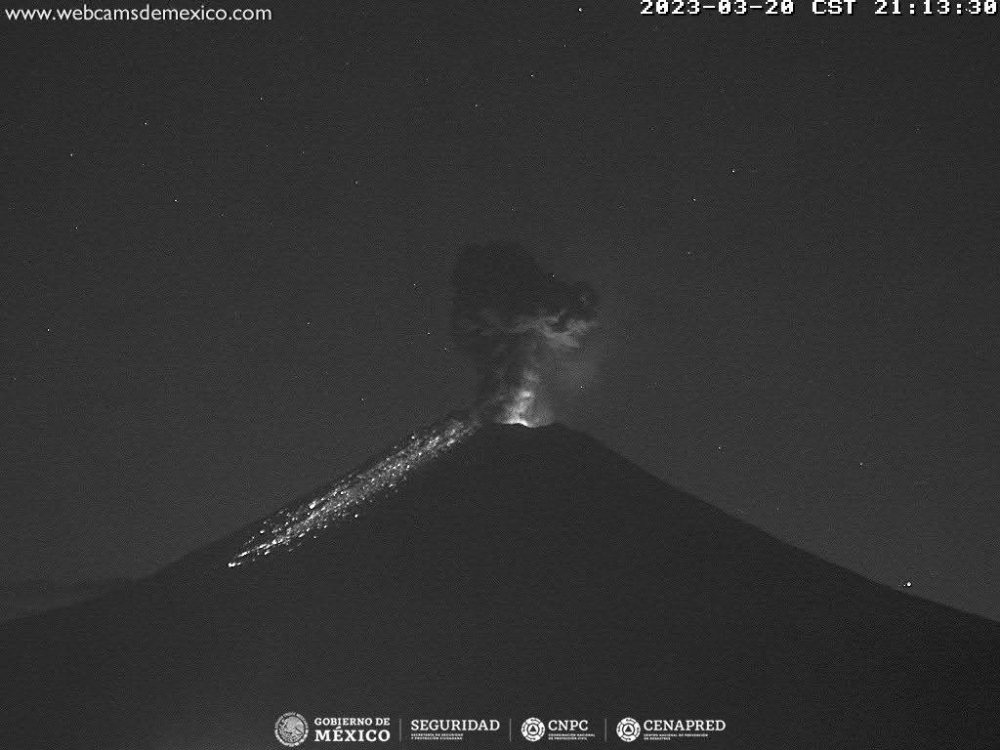

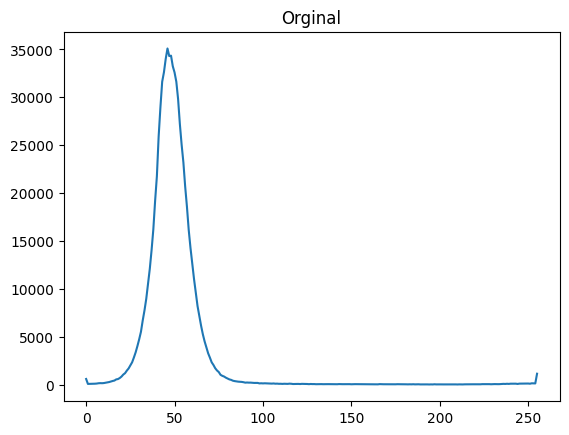

In [28]:
from skimage import io
from google.colab.patches import cv2_imshow

img_source = "/content/drive/MyDrive/VisionComp_Imagenes/data/popo2.jfif"
img_gama = io.imread(img_source)
cv2_imshow(cv2.cvtColor(img_gama, cv2.COLOR_BGR2RGB))
hist_gamma(img_gama,"Orginal")

Podemos ver en el mejoramiento de la imagen que hemos removido todos los demás elementos y solo nos quedamos con el volcán popocatepetl.

Eliminamos las estreñas e incluso parcialmente los logos gubernamentales.

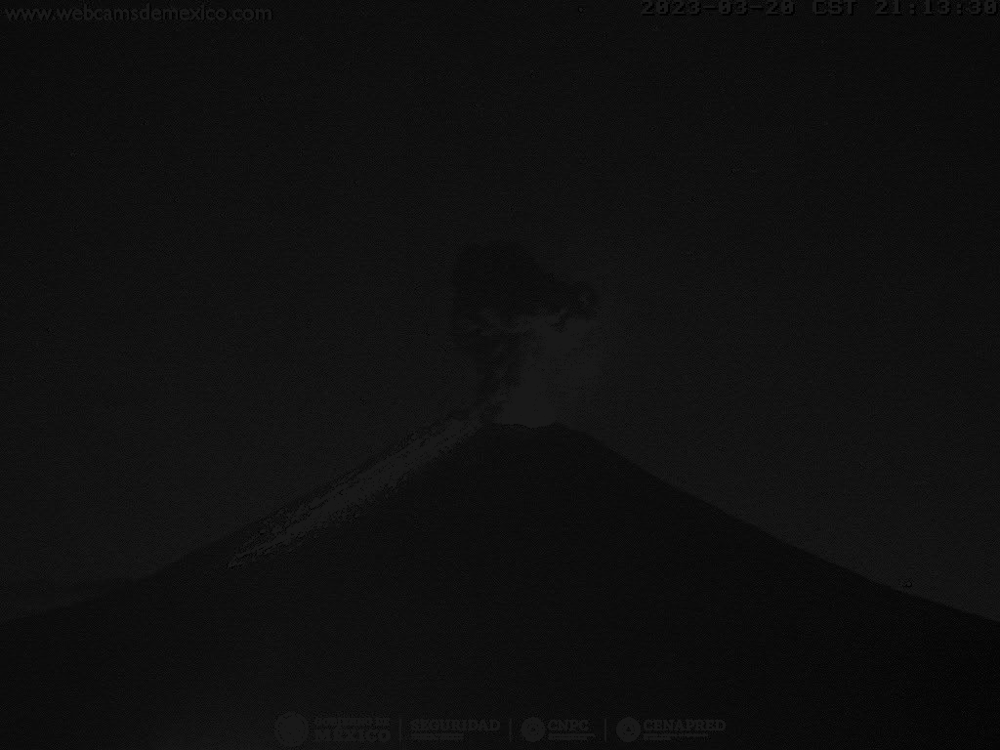

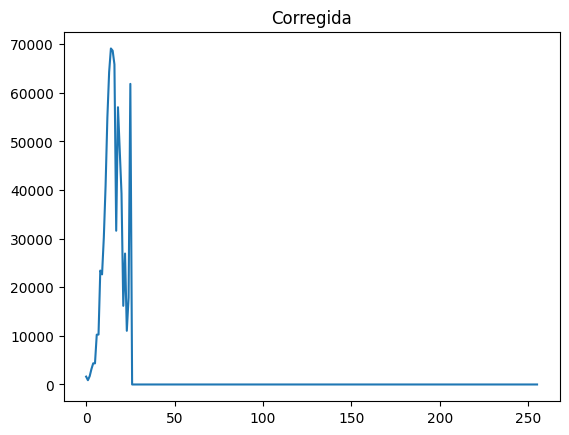

In [29]:
#Corregimos la imagen mediante el uso de Gamma
img_gama_corrected = corr_gamma(img_gama,0.6)
cv2_imshow(cv2.cvtColor(img_gama_corrected, cv2.COLOR_BGR2RGB))
hist_gamma(img_gama_corrected,"Corregida")

Nota: Se puede observar que se han eliminado las estrellas y ruido de fondo. Solo nos hemos quedado con el contorno del volcán.

(Agregar más conclusiones y justificación)

# Punto 4
Investiga una aplicación donde se puede usar la sustracción de imágenes e integra el código en en una fila de google collab, justificar brevemente tu investigación, haciendo una demo sencilla.

La substracción de imagenes tiene la siguiente formula: \\

$$ g(x,y) = f(x,y) - h(x,y) $$

In [30]:
# Definiendo la funcion de sustraccion entre 2 imagenes

def sustraccion_img(img1,img2):
  # Redefinimos el tamaño de ambas imagenes al mismo tamaño
  img_a = cv2.resize(img1,(400,400), interpolation=cv2.INTER_CUBIC)
  img_b = cv2.resize(img2,(400,400), interpolation=cv2.INTER_CUBIC)

  # Resta de las imagenes usando el metodo definido en cv2
  img_sust1 = cv2.subtract(img_a,img_b)
  img_sust2 = cv2.subtract(img_b,img_a)

  print ("Resta imagen a - imagen b")
  img_out = cv2_imshow(cv2.cvtColor(img_sust1, cv2.COLOR_BGR2RGB))
  print ("Resta imagen b - imagen a")
  img_out = cv2_imshow(cv2.cvtColor(img_sust2, cv2.COLOR_BGR2RGB))




Imagen 1 



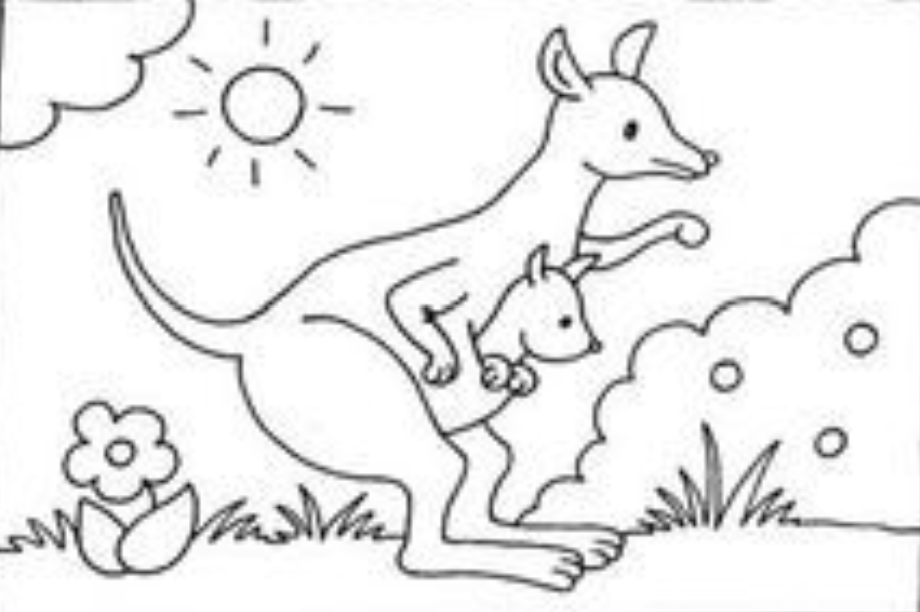

Imagen 2 



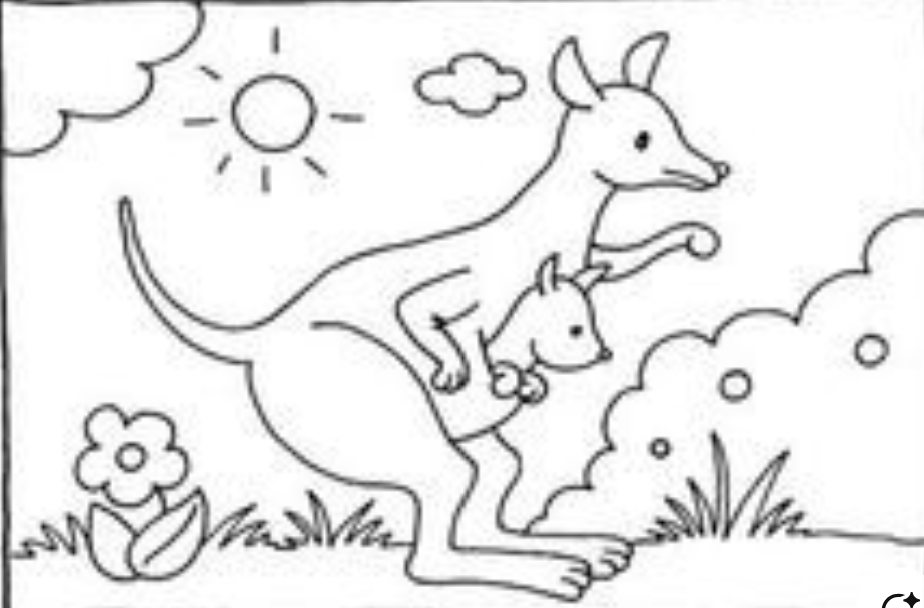

In [31]:
img1 = "/content/drive/MyDrive/VisionComp_Imagenes/data/canguro1.png"
img2 = "/content/drive/MyDrive/VisionComp_Imagenes/data/canguro2.png"
img_s1 = io.imread(img1)
img_s2 = io.imread(img2)
print("Imagen 1 \n")
cv2_imshow( cv2.cvtColor(img_s1, cv2.COLOR_BGR2RGB))
print("Imagen 2 \n")
cv2_imshow(cv2.cvtColor(img_s2, cv2.COLOR_BGR2RGB))


Resta imagen a - imagen b


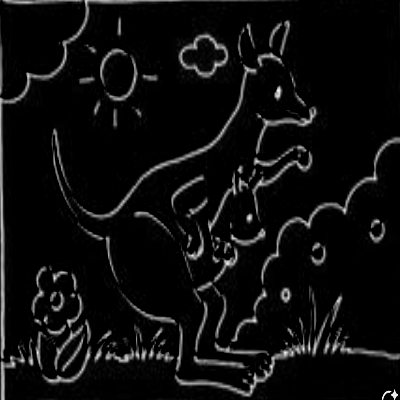

Resta imagen b - imagen a


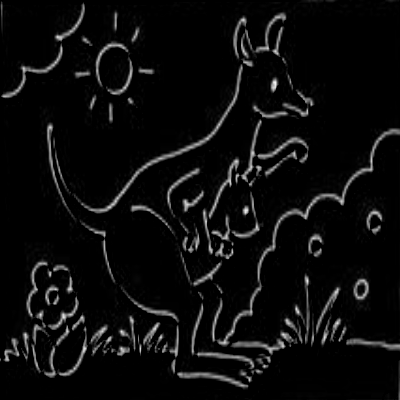

In [32]:
sustraccion_img(img_s1, img_s2)

Ejemplo con dos imagenes tipo "Encuentra las 5 diferencias" podemos ver que la resta hace que elementos de la imaben b aparezcan en la imagen a (Como la nube)

(Nota: Agregar otro ejemplo) y conclusiones del collab.